In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from fitburst.analysis.model import SpectrumModeler
from astropy.constants import c

from scipy.interpolate import interp1d
from scipy.signal import correlate, correlation_lags
# from scipy.signal import peak_widths

# from RMtools_1D.do_RMsynth_1D import run_rmsynth
# from RMtools_1D.do_RMclean_1D import run_rmclean

In [2]:
# Default plot parameters
plt.rcParams.update({
    "figure.dpi": 300,
    "figure.figsize": (8, 6),
    "font.size": 12,
    "font.family": "serif",
    "figure.titlesize": 16,
    "axes.titlesize": 14,
    # "axes.labelsize": 12,
    # "xtick.labelsize": 12,
    # "ytick.labelsize": 12,
    "axes.labelsize": 14,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 12,
    #"image.cmap": "viridis",
    "image.interpolation": "nearest",
    "axes.grid": False,
    "savefig.bbox": "tight",
})

In [3]:
# Freq and time arrays
freq = np.linspace(400, 800, 1024)  # [MHz]
tsamp = 1 
t_unit = 'ms'
time = np.arange(0, 3600, tsamp)

# Simulating a Burst

### Create Model --> Stokes I

In [4]:
# --- Model parameters ---
num_bursts = 2  # number of bursts to model
TIME_TRUE = [2000, 2500]  # true arrival times of the bursts
burst_amp_exp = [2.5, 3]  # Base-10 exponent of amplitude for bursts
burst_amp = [10**amp for amp in burst_amp_exp]  # Convert to amplitude
lower_peak_ti = TIME_TRUE[np.argmin(burst_amp_exp)]  # time of lower peak

# Burst parameters
burst_params_1 = {
    "amplitude"            : [burst_amp_exp[0]],  # overall signal amplitude
    "arrival_time"         : [TIME_TRUE[0]],  # when burst starts
    "burst_width"          : [5],  # width in time
    "dm"                   : [0.],
    "dm_index"             : [-2.],  # don't touch 
    "ref_freq"             : [500.],  # ref freq for arrival-time and power-law param estimates
    "scattering_index"     : [-4.],  # index of the scattering timescale, don't touch
    "scattering_timescale" : [0.],  # don't touch
    "spectral_index"       : [0.],  # how flat across frequency
    "spectral_running"     : [-10.],  # additional curvature
}
burst_params_2 = {
    "amplitude"            : [burst_amp_exp[1]],  # overall signal amplitude
    "arrival_time"         : [TIME_TRUE[1]],  # when burst starts
    "burst_width"          : [7],  # width in time
    "dm"                   : [0.],
    "dm_index"             : [ -2.],  # don't touch 
    "ref_freq"             : [700],  # ref freq for arrival-time and power-law param estimates
    "scattering_index"     : [-4.],  # index of the scattering timescale, don't touch
    "scattering_timescale" : [0.],  # don't touch
    "spectral_index"       : [0.],  # how flat across frequency
    "spectral_running"     : [-10.],  # additional curvature
}
burst_params = [burst_params_1, burst_params_2]


# --- Other parameters ---
# Pol fractions
pol_frac_linear = [0.7, 0.4]  # can also have diff fractions for U and Q
pol_frac_circular = 0.

# Intrinsic polarization angle
psi_0 = 30  # [deg]
psi_0_rad = np.radians(psi_0)  # [rad]

# RM
RM_true = [-120,500]  # [rad/m^2] 


In [5]:
# --- Get Stokes I ---
I_components = np.empty((num_bursts, len(freq), len(time)))  # (Nbursts, Nfreqs, Ntimes)

for i in range(num_bursts):
    # Create model & update parameters
    model = SpectrumModeler(freq, time)
    model.update_parameters(burst_params[i])

    # Get model spectrum (Stokes I)
    I_components[i] = model.compute_model()  # (Nfreqs, Ntimes)

# Get array of Stokes I (with all bursts)
I = np.sum(I_components, axis=0)  # (Nfreqs, Ntimes)

In [6]:
# Plot models
# for i in range(num_bursts):
#     fig, ax = plt.subplots()

#     extent = (time[0], time[-1], freq[0], freq[-1])
#     im = ax.imshow(I_components[i], interpolation='nearest', origin='lower', aspect='auto', extent=extent, cmap='copper')

#     fig.colorbar(im, ax=ax, label='')
#     ax.set_xlabel(f'Time [{t_unit}]')
#     ax.set_ylabel('Frequency [MHz]')
#     ax.set_title(f'Stokes I (Burst {i+1})')
#     plt.show()

### Polarizations --> Stokes Q, U, V

In [ ]:
# --- Create other Stokes parameters ---
Q_components = np.zeros_like(I_components)
U_components = np.zeros_like(I_components)
V = np.zeros_like(I_components)

for i in range(num_bursts):
    Q_components[i] = I_components[i] * pol_frac_linear[i] * np.cos(2 * psi_0_rad)  # Q = I p cos(2*psi_0)
    U_components[i] = I_components[i] * pol_frac_linear[i] * np.sin(2 * psi_0_rad)  # U = I p sin(2*psi_0)
V = I * pol_frac_circular

In [8]:
# --- 4-panels plot functions ---
def get_colorscale(max_I, i, cbar_max=None):
    if cbar_max is None:
        vmax = max_I if i==0 else max_I/2
    else:
        vmax = cbar_max
    vmin = 0 if i==0 else -vmax
    linear = plt.cm.colors.Normalize(vmin=vmin, vmax=vmax)

    return linear


def add_rfi_rectangles(ax, rfi_masked, freq=freq, time=time):
    """
    Add rectangles to ax to highlight RFI channels.

    Parameters
    ----------
    ax : plt ax object to add rectangles to.
    rfi_masked : List of RFI channels to highlight in red.
    freq : Frequency array (MHz).
    time : Time array (in t_unit).
    """

    n_channels = len(freq)
    channel_height = (freq[-1] - freq[0]) / n_channels
    tick_width = 0.04 * (time[-1] - time[0])

    for rfi in rfi_masked:
        f_center = freq[rfi]
        bottom = f_center - channel_height/2

        rect = patches.Rectangle(
            (time[0], bottom),        
            tick_width,                  
            channel_height,             
            linewidth=0,
            facecolor='red',
            zorder=10
        )
        ax.add_patch(rect)


def plot_stokes(stokes_params, freq=freq, time=time, t_unit=t_unit, suptitle='', 
                cbar_max=None, rfi_masked=None, height_ratio=0.3):
    """
    Plot Stokes parameters I, Q, U, V in a 2x2 grid.

    Parameters
    ----------
    stokes_params : List of 4 arrays for Stokes I, Q, U, V.
    freq : Frequency array (MHz).
    time : Time array (in t_unit).
    t_unit : Defines the unit for the time array (e.g., 'ms', 's').
    suptitle : Title for the entire figure.
    cbar_max : Maximum value for colorbar scaling (sets the min for Q, U, and V).
    rfi_masked : List of RFI channels to highlight in red.
    """
    
    # Figure info
    fig = plt.figure(figsize=(10, 10))
    outer = gridspec.GridSpec(2, 2, hspace=0.2, wspace=0.15)  # 2x2 grid for Stokes parameters
    extent = (time[0], time[-1], freq[0], freq[-1])
    subtitles = ['I', 'Q', 'U', 'V']
    max_I = np.max(stokes_params[0])

    for i in range(4):
        row = i // 2
        col = i % 2

        # Define grid for timeseries and Stokes parameter plots
        inner = gridspec.GridSpecFromSubplotSpec(
            2, 1,  # 2 rows: timeseries + stokes
            subplot_spec=outer[row, col],
            height_ratios=[height_ratio, 1],
            hspace=0.0  # no space between timeseries and stokes
        )

        # Add subplots
        timeseries_ax = fig.add_subplot(inner[0])
        stokes_ax = fig.add_subplot(inner[1], sharex=timeseries_ax)

        # --- Add timeseries plot ---
        timeseries = np.mean(stokes_params[i], axis=0)  # Average over frequency
        timeseries_ax.scatter(time, timeseries, color='black', s=1)
        timeseries_ax.set_title(f'Stokes {subtitles[i]}')
        timeseries_ax.tick_params(length=0, labelbottom=False, labelleft=False)

        # --- Add Stokes parameter plot ---
        linear = get_colorscale(max_I, i, cbar_max=cbar_max)  # Color scaling
        # if cbar_lim is None:
        # cbar_lim = stokes_params
        # vmin = np.nanpercentile(cbar_lim[i], 5)
        # vmax = np.nanpercentile(cbar_lim[i], 95)
        # linear = plt.cm.colors.Normalize(vmin=vmin, vmax=vmax)
        # Plot data
        im = stokes_ax.imshow(stokes_params[i], 
                       interpolation='nearest', 
                       origin='lower', 
                       aspect='auto', 
                       extent=extent, 
                       cmap='viridis',
                       norm=linear
                       )
        
        # Colorbar
        # fig.colorbar(im, ax=stokes_ax, location='bottom', label='')
        
        # Highlight RFI channels
        if rfi_masked is not None:
            add_rfi_rectangles(stokes_ax, rfi_masked, freq=freq, time=time)

        # Axes labels
        # stokes_ax.tick_params(labelsize=12)
        if i >= 2:
            stokes_ax.set_xlabel(f'Time [{t_unit}]')
        if i % 2 == 0:
            stokes_ax.set_ylabel('Frequency [MHz]')

    plt.suptitle(suptitle)
    # plt.tight_layout()
    plt.subplots_adjust(top=0.93) 
    plt.show()

In [9]:
# plot_stokes([I, np.sum(Q_components,axis=0), np.sum(U_components, axis=0), V], suptitle='Before RM')

No rotation measure yet so the pol angle doesn't change as a function of freq. Setting psi_0 to 0 means the linear component is 100% (of the frac we chose) along the 0-90 basis, ie we only get Stokes Q. If we set psi_0 to 45 then we have 100% of the linear pol along the +-45 basis so we only get stokes U.

Once we add some RM, we should get some Q and U no matter what the intrinsic pol angle is since it gets rotated as a function of freq.

### Rotation Measure

Reminder:
$$ Q_{obs} = I_{model} p \cos(2(RM\lambda^2 + \psi_0)) $$

We already added the psi_0 part when creating Q and U, now we want to add the RM part

To do this, we rotate the intrinsic Q and U
$$ Q = I p \cos(2\psi_0),\, U = I p \sin(2\psi_0) $$


using

$$
\begin{bmatrix}
Q'(\nu, t) \\
U'(\nu, t)
\end{bmatrix} =
\begin{bmatrix}
\cos(2\,\mathrm{RM} \cdot \lambda^2) & -\sin(2\,\mathrm{RM} \cdot \lambda^2) \\
\sin(2\,\mathrm{RM} \cdot \lambda^2) & \cos(2\,\mathrm{RM} \cdot \lambda^2)
\end{bmatrix}
\begin{bmatrix}
Q(\nu, t) \\
U(\nu, t)
\end{bmatrix}
$$

\*\* sign convention: rotating the data with exp(RM...) so exp(-RM...) derotates the data

In [10]:
# P = Q + iU  # derotated/intrinsic

# P' = (Q + iU) * exp(+) = (Q + iU) * (cos + isin)
#                        = Qcos +iQsin + iUcos - Usin

# Q' = Qcos - Usin
# U' = Qsin + Ucos

In [ ]:
def apply_rm(I, Q, U, RM, freq):
    """
    Apply rotation measure to Stokes Q and U.

    Return the rotated Q and U parameters.

    Parameters
    ----------
    I : Stokes I intensity (shape: [Nfreqs, Ntimes]).
    Q : Stokes Q parameter (shape: [Nfreqs, Ntimes]).
    U : Stokes U parameter (shape: [Nfreqs, Ntimes]).
    RM : Rotation measure (shape: [Nfreqs]). In rad/m^2.
    freq : Frequency array (shape: [Nfreqs]). In MHz.
    """
    # Change zeros to NaN in off-burst region
    mask = (I < 1e-7)  # approx that off-burst is where 1e-7
    Q[mask] = np.nan
    U[mask] = np.nan
    # plot_stokes([I, Q, U, V], suptitle='After masking off-burst region')

    # dpsi = 2RM * lambda^2
    lambda_sq = (c.value/(freq*1e6))**2  # shape (Nfreqs)
    dpsi = 2 * RM * lambda_sq

    # Rotate Q and U
    cos_dpsi = np.cos(dpsi)[:, np.newaxis]  # shape (Nfreqs, 1)
    sin_dpsi = np.sin(dpsi)[:, np.newaxis]  # shape (Nfreqs, 1)

    Q_rot = Q*cos_dpsi - U*sin_dpsi
    U_rot = Q*sin_dpsi + U*cos_dpsi

    # Switch back NaNs to 0
    Q_rot = np.nan_to_num(Q_rot)
    U_rot = np.nan_to_num(U_rot)

    return Q_rot, U_rot

In [12]:
Q_rot_components = np.zeros_like(Q_components)
U_rot_components = np.zeros_like(U_components)

# Apply RM to each burst's Q and U components
for i in range(num_bursts):
    Q_rot_components[i], U_rot_components[i] = apply_rm(
        I_components[i], Q_components[i], U_components[i], RM_true[i], freq
    )

# Combine rotated components
Q_rot = np.sum(Q_rot_components, axis=0)  # (Nfreqs, Ntimes)
U_rot = np.sum(U_rot_components, axis=0)  # (Nfreqs, Ntimes)

In [13]:
# Plot rotated Stokes parameters
# plot_stokes([I, Q_rot, U_rot, V], suptitle='With RM')

In [14]:
# plt.plot(time, np.mean(I, axis=0))
# plt.xlabel(f'Time [{t_unit}]')
# plt.ylabel('Flux')
# plt.title('Avg I spectrum')
# plt.show()

### Noise

In [ ]:
# Get noise mean and std
noise_mean = 0
I_spec = np.mean(I, axis=0)  # band avg intensity
lower_burst_amp = I_spec[lower_peak_ti]  # avg intensity of lower burst in spectrum
noise_std = lower_burst_amp/10 * np.sqrt(freq.size)  # noise std = x10 smaller than band avg intensity (of lower burst)

# Generate & add noise
I_noise = I + np.random.normal(loc=noise_mean, scale=noise_std, size=I.shape)
Q_noise = Q_rot + np.random.normal(loc=noise_mean, scale=noise_std, size=Q_rot.shape)
U_noise = U_rot + np.random.normal(loc=noise_mean, scale=noise_std, size=U_rot.shape)
V_noise = V + np.random.normal(loc=noise_mean, scale=noise_std, size=V.shape)

# Get pol/unpol parts of Stokes I (to get back Q & U later)
I_noise_pol = np.sqrt(Q_noise**2 + U_noise**2 + V_noise**2)
I_noise_unpol = I_noise - I_noise_pol

# Plot
# plot_stokes([I_noise, Q_noise, U_noise, V_noise], suptitle='With RM + noise')


In [16]:
# plt.plot(time, np.mean(I_noise, axis=0))
# plt.xlabel(f'Time [{t_unit}]')
# plt.ylabel('Flux')
# plt.title('I spectrum')
# # plt.ylim(0, lower_burst_amp)
# plt.show()

### RFI

Adding RFI

In [14]:
# Initialize full RFI mask
rfi_mask_all = np.zeros_like(freq, dtype=bool)  # boolean mask for RFI channels


# --- Add fixed RFI bands ---
band_ranges = [(450, 470), (700, 750)]  # MHz ranges for RFI bands
in_band_channels = []  # List to store indices of in-band RFI channels

for f_start, f_end in band_ranges:
    # Freq indices for the RFI bands
    i_start = np.argmin(np.abs(freq - f_start))
    i_end = np.argmin(np.abs(freq - f_end)) + 1  # +1 to include the end channel
    # Add to mask
    rfi_mask_all[i_start:i_end] = True 
    in_band_channels.extend(np.arange(i_start, i_end))  # save indices of in-band RFI channels

in_band_channels = np.array(in_band_channels)


# --- Add random out-of-band RFI chunks ---
N_chunks = 20  # Number of random RFI chunks to add
chunk_sizes = np.random.randint(2, 5, size=N_chunks)  # Random chunk size between 2 and 4 channels
start_channels = np.random.choice(
    freq.size - 4,  # -4 to not go over freq array size
    size=N_chunks,
    replace=False
)
out_of_band_chunks = np.array(
    [[start, start + size] 
     for start, size in zip(start_channels, chunk_sizes)
    ]
)  # saving chunk start and end indices

for start, end in out_of_band_chunks:
    rfi_mask_all[start:end] = True  # add to mask
    # print(f"RFI chunk: {freq[start]:.3f}–{freq[end-1]:.3f} MHz (size {end-start})")


# --- Get RFI values ---
# Get mean RFI value based on noise std
rfi_mean = 10 * noise_std / np.sqrt(freq.size)
N_rfi_ch = np.sum(rfi_mask_all)  # Total number of RFI channels
log_rfi = np.random.lognormal(mean=np.log(rfi_mean), sigma=1, size=(N_rfi_ch,1))

# --- Add semi-periodic RFI ---
# Parameters for multiple sine waves
rfi_periods = [50, 100, 120]  # Period in number of freq channels
rfi_amplitudes = [1.0, 1.0, 1.0]  # Amplitudes of each sine wave
rfi_phases = np.random.uniform(0, 2*np.pi, size=len(rfi_periods))  # Random phase offsets

# Create a sine wave for periodic RFI
sine_waves = []
for period, amp, phase in zip(rfi_periods, rfi_amplitudes, rfi_phases):
    sine = amp * np.sin(2 * np.pi * np.arange(freq.size) / period + phase)
    sine_waves.append(sine)
sine_sum = np.sum(sine_waves, axis=0)  # Sum of all sine waves

periodic_rfi = 1 + sine_sum[rfi_mask_all][:, np.newaxis]  # Shape: (N_rfi_ch, 1)

# Combine RFI values
rfi_values = log_rfi * periodic_rfi *10  # Shape: (N_rfi_ch, 1)

In [15]:
# --- Get Stokes with RFI ---
# Add RFI to I_unpol, Q, U, V
I_noise_unpol[rfi_mask_all] += rfi_values
Q_noise[rfi_mask_all] += rfi_values
U_noise[rfi_mask_all] += rfi_values
V_noise[rfi_mask_all] += rfi_values

# Update I_pol
I_rfi_pol = np.sqrt(Q_noise**2 + U_noise**2 + V_noise**2)
# Get full I
I_rfi = I_noise_unpol + I_rfi_pol

In [19]:
# plot_stokes([I_rfi, Q_noise, U_noise, V_noise], cbar_max=np.max(burst_amp))

In [20]:
# plt.plot(time, np.mean(I_rfi, axis=0))
# plt.xlabel(f'Time [{t_unit}]')
# plt.ylabel('Flux')
# plt.title('I spectrum')
# # plt.ylim(0, lower_burst_amp)
# plt.show()

Masking some of the RFI

In [16]:
# --- Mask in-band channels; keep chunks of 3 unmasked ---
in_percent = 0.65  # percentage of in-band channels to keep *unmasked*
N_chunks_keep = int(in_band_channels.size * in_percent) // 3  # keep % of channels unmasked, in chunks of 3
start_inds = np.random.choice(
    np.arange(in_band_channels.size - 2),  # -2 to not go over in_band_channels size
    size=N_chunks_keep, 
    replace=False)
unmasked_in_band = np.concatenate([in_band_channels[i:i+3] for i in start_inds])

masked_in_band = np.zeros_like(freq, dtype=bool)
masked_in_band[in_band_channels] = True  # mask all in-band channels
masked_in_band[unmasked_in_band] = False  # unmask %


# --- Mask out-of-band chunks ---
out_percent = 0.35  # percentage of out-of-band chunks to *mask*
N_mask_chunks = int(N_chunks * out_percent)  # 35% of chunks
masked_chunk_inds = np.random.choice(
    N_chunks,
    size=N_mask_chunks,
    replace=False
)  # get indices of chunks to mask
masked_out_of_band = np.zeros_like(freq, dtype=bool)
for i in masked_chunk_inds:
    start, end = out_of_band_chunks[i]
    masked_out_of_band[start:end] = True


# --- Combine masked channels ---
rfi_masked_ch = np.sort(np.concatenate([
    np.flatnonzero(masked_in_band),
    np.flatnonzero(masked_out_of_band)
]))  # (True = masked)

In [17]:
# Update Stokes
I_rfi[rfi_masked_ch] = 0
Q_noise[rfi_masked_ch] = 0
U_noise[rfi_masked_ch] = 0
V_noise[rfi_masked_ch] = 0

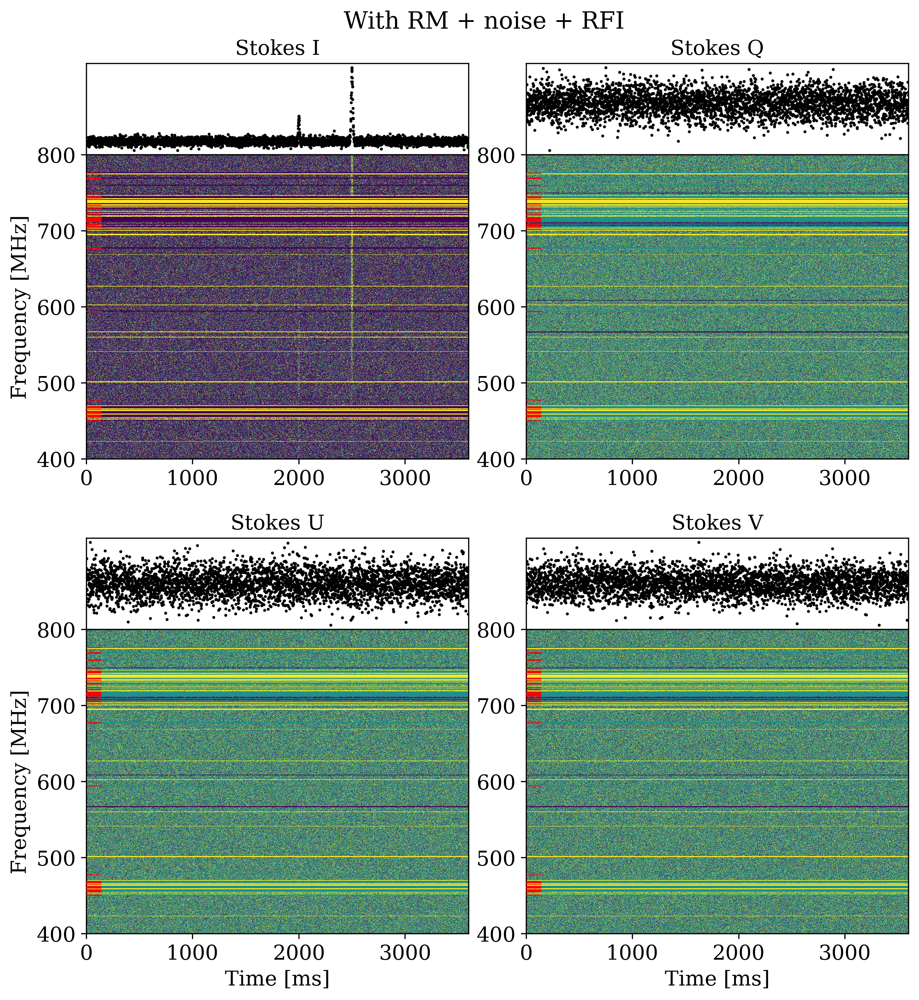

In [18]:
plot_stokes([I_rfi, Q_noise, U_noise, V_noise], cbar_max=np.max(burst_amp), rfi_masked=rfi_masked_ch, suptitle='With RM + noise + RFI')

### Plots for slides

In [ ]:
# bursts = [I, Q_rot, U_rot, V]
# bursts_junk = [I_rfi, Q_noise, U_noise, V_noise]
# max_I = [np.max(I), np.max(I_rfi)]

# for i,b in enumerate(bursts):
#     plt.figure(figsize=(5,5), dpi=200)
#     extent = (time[0], time[-1], freq[0], freq[-1])
#     linear = get_colorscale(max_I[0], i)
#     im = plt.imshow(b, 
#                     interpolation='nearest', 
#                     origin='lower', 
#                     aspect='auto', 
#                     extent=extent, 
#                     cmap='viridis',
#                     norm=linear
#                     )

#     plt.title(f'Stokes {["I", "Q", "U", "V"][i]}')
#     plt.xlabel('Time [ms]')
#     plt.ylabel('Frequency [MHz]')
#     plt.show()

# for i,b in enumerate(bursts_junk):
#     fig = plt.figure(figsize=(5,5), dpi=200)
#     ax = fig.add_subplot(111)
#     extent = (time[0], time[-1], freq[0], freq[-1])
#     linear = get_colorscale(max_I[0], i, cbar_max=np.max(burst_amp))
#     im = plt.imshow(b, 
#                     interpolation='nearest', 
#                     origin='lower', 
#                     aspect='auto', 
#                     extent=extent, 
#                     cmap='viridis',
#                     norm=linear
#                     )

#     add_rfi_rectangles(ax, rfi_masked_ch, freq=freq, time=time)
#     plt.title(f'Stokes {["I", "Q", "U", "V"][i]}')
#     plt.xlabel('Time [ms]')
#     plt.ylabel('Frequency [MHz]')
#     plt.show()

### Plot Spectra

In [20]:
# --- Spectra Functions ---
def get_spectra(Q, U, t_range=[0,None], freq=freq, f_range=[0,None], normalize=True, replace_nans=True):
    """
    Calculate Q and U spectra.

    Returns normalized Q and U spectra averaged over the specified time range.

    Parameters
    ----------
    Q : Stokes Q array (shape: [Nfreqs, Ntimes]).
    U : Stokes U array (shape: [Nfreqs, Ntimes]).
    t_range : Time range to average over (in indices) [start, stop].
    freq : Frequency array (in MHz), matches Nfreqs.
    f_range : Frequency range to get the spectrum for (in indices) [start, stop].
    normalize : If True, normalize the spectra by L.
    replace_nans : If True, replace NaNs with 0 in the normalized spectra.
    """
    
    # Time average
    f_start, f_stop = f_range
    freq = freq[f_start:f_stop]
    t_start, t_stop = t_range
    Q_spec = np.mean((Q)[f_start:f_stop,t_start:t_stop], axis=1)
    U_spec = np.mean((U)[f_start:f_stop,t_start:t_stop], axis=1)

    # Normalize
    if normalize:
        L_spec = np.sqrt(Q_spec**2 + U_spec**2)
        Q_spec_norm = Q_spec / L_spec
        U_spec_norm = U_spec / L_spec
    else:
        Q_spec_norm = Q_spec
        U_spec_norm = U_spec

    # Handle NaNs
    if replace_nans:
        Q_spec_norm = np.nan_to_num(Q_spec_norm, nan=0.0)
        U_spec_norm = np.nan_to_num(U_spec_norm, nan=0.0)

    return Q_spec_norm, U_spec_norm


def plot_spectra(Q, U, t_range=[0,None], freq=freq, f_range=[0,None], normalize=True, replace_nans=True):
    """
    Calculate and plot Q and U spectra.

    Returns normalized Q and U spectra averaged over the specified time range.

    Parameters
    ----------
    Q : Stokes Q array (shape: [Nfreqs, Ntimes]).
    U : Stokes U array (shape: [Nfreqs, Ntimes]).
    t_range : Time range to average over (in indices) [start, stop].
    freq : Frequency array (in MHz), matches Nfreqs.
    f_range : Frequency range to get the spectrum for (in indices) [start, stop].
    normalize : If True, normalize the spectra by L.
    replace_nans : If True, replace NaNs with 0 in the normalized spectra.
    """

    # Get spectra for given range
    Q_spec_norm, U_spec_norm = get_spectra(Q, U, t_range=t_range, freq=freq, f_range=f_range, 
                                           replace_nans=replace_nans, normalize=normalize
                                           )
    f_start, f_stop = f_range
    freq = freq[f_start:f_stop]

    # Plot
    fig,axes = plt.subplots(2, figsize=(20,8))
    # stokes Q
    axes[0].plot(freq, Q_spec_norm)
    axes[0].set_ylabel('Q/L')
    # stokes U
    axes[1].plot(freq, U_spec_norm)
    axes[1].set_ylabel('U/L')
    axes[1].set_xlabel('Frequency [MHz]')

    for ax in axes:
        ax.set_xlim(freq[0], freq[-1])
    plt.show()

    return Q_spec_norm, U_spec_norm

Time range for burst 1: 1995 to 2005 ms


/var/folders/8r/nd1rwfxs3vd_hvxw9nj4rqp00000gn/T/ipykernel_5958/913211876.py:29: RuntimeWarning: invalid value encountered in divide
  Q_spec_norm = Q_spec / L_spec
/var/folders/8r/nd1rwfxs3vd_hvxw9nj4rqp00000gn/T/ipykernel_5958/913211876.py:30: RuntimeWarning: invalid value encountered in divide
  U_spec_norm = U_spec / L_spec


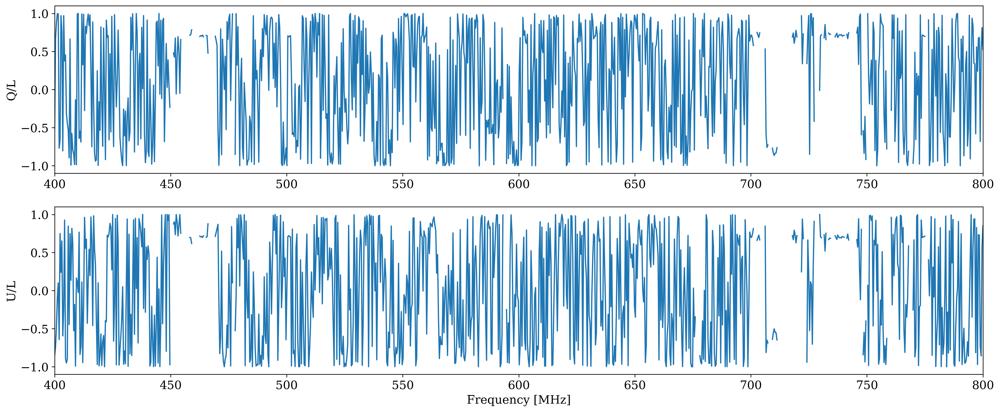

Time range for burst 2: 2490 to 2510 ms


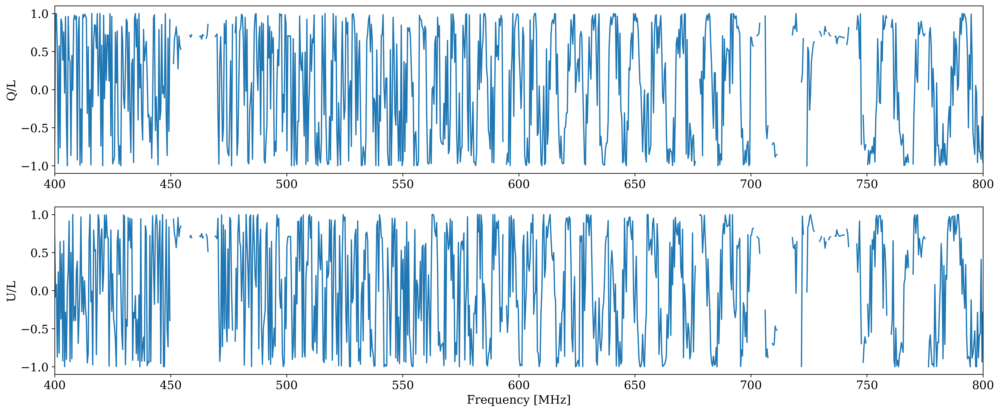

In [21]:
# Plot burst spectra (to check)
half_step = 5
t_start = np.argmin(np.abs(time - TIME_TRUE[0] + half_step))
t_stop = np.argmin(np.abs(time - TIME_TRUE[0] - half_step))
print(f"Time range for burst 1: {time[t_start]} to {time[t_stop]} {t_unit}")
Q_spec_norm_1, U_spec_norm_1 = plot_spectra(Q_noise, U_noise, t_range=[t_start, t_stop], 
                                            replace_nans=False)

half_step = 10
t_start = np.argmin(np.abs(time - TIME_TRUE[1] + half_step))
t_stop = np.argmin(np.abs(time - TIME_TRUE[1] - half_step))
print(f"Time range for burst 2: {time[t_start]} to {time[t_stop]} {t_unit}")
Q_spec_norm_2, U_spec_norm_2 = plot_spectra(Q_noise, U_noise, t_range=[t_start, t_stop], 
                                            replace_nans=False)

# Analysis

### RMSF

$$ R(\phi) = \frac{1}{W} \sum_j W_j e^{-2i\phi(\lambda_j^2)} $$

In [27]:
# Define weight function (with and without masked channels)
W_full = np.ones_like(freq)
W = W_full.copy()
W[rfi_masked_ch] = 0  # Set bad channels to zero (rfi_masked_ch=True where masked)

# lambda^2 array
lambda2_array = (c.value/(freq*1e6))**2  # shape (Nfreqs)
l2_min = np.min(lambda2_array)
l2_max = np.max(lambda2_array)
dl2 = np.median(np.abs(np.diff(lambda2_array)))
Dl2 = l2_max - l2_min  # total range of lambda^2

# phi array
fwhm = 2 * np.sqrt(3) / Dl2  # FWHM of the RMSF
# phi_max = np.sqrt(3)/dl2  # max RM to search
# phi_max = 10 * fwhm  # ~10*FWHM
phi_max = 1500
dphi = 0.05 * fwhm  # spacing between phi values, ~0.1*FWHM
phi_array = np.arange(-phi_max, phi_max + dphi, dphi)  # shape (N_phi,)
N_phi = len(phi_array)

In [28]:
# Compute FSF (RMSF) w/ masked channels
K = 1.0 / np.nansum(W)  # normalization constant
a = (-2.0 * 1j * phi_array).astype('complex64')  # exponent for RMSF
b = np.outer(a, lambda2_array)  # shape (Nphi, Nlambda2)
RMSF = K * np.sum(W * np.exp(b), 1)  # sum along lambda axis & normalize

# RMSF w/ all channels
K_full = 1.0 / np.sum(W_full)  # normalization constant
RMSF_full = K_full * np.sum(W_full * np.exp(b), 1)  # sum along lambda axis & normalize

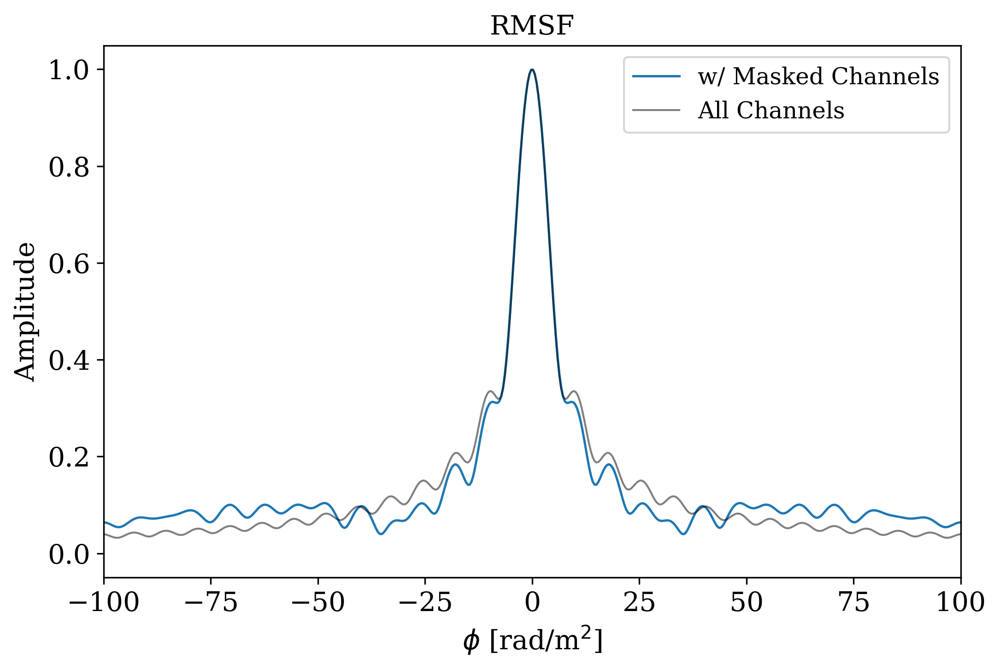

In [29]:
# Plot FSF
plt.figure(figsize=(8, 5))
plt.title('RMSF')

plt.plot(phi_array, np.abs(RMSF), lw=1.2, label='w/ Masked Channels')
plt.plot(phi_array, np.abs(RMSF_full), lw=1, alpha=0.5, c='k', label='All Channels')
plt.xlim(-100,100)

plt.xlabel(r'$\phi$ [rad/m$^2$]')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.show()

### RM Synthesis

$$ F(\phi) = \int_{-\infty}^{\infty} P(\lambda^2) e^{-2i\phi\lambda^2} d\lambda^2 $$

We measure P and we take the inverse transform to recover F. This is the measured/observed FDF (ie true fdf convolved with R, which is the transform of W)

Do this discretely by summing over the lambdas for a range of phi values

$$ F(\phi) = \frac{1}{W} \sum_j P(\lambda_j^2) e^{-2i\phi\lambda_j^2} $$

where P takes into account the masked channels (W * data)

In [30]:
def rm_synthesis(P_spec, lambda_sq, phi_array):
    """
    Perform RM synthesis on the given P spectrum.
    
    Parameters
    ----------
    P_spec : Normalized complex P spectrum (shape: [Nfreqs,]).
    lambda_sq : Squared wavelength array (shape: [Nfreqs,]). In m^2.
    phi_array : Array of phi values to compute the FDF for (shape: [N_phi,]). In rad.

    Returns
    -------
    RM_meas : Phi value at which the peak of the FDF occurs (in rad/m^2).
    FDF : F(phi) for the given P_spec (shape: [N_phi,]).
    """

    # new
    K = 1.0 / np.nansum(W)  # normalization constant
    a = (-2.0 * 1j * phi_array).astype('complex64')
    b = np.outer(a, lambda_sq)  # shape (Nphi, Nlambda2)
    FDF = K * np.sum(P_spec * np.exp(b), 1)  # sum along lambda axis & normalize

    # Find peak phi (= RM)
    FDF_peak_ind = np.argmax(np.abs(FDF))
    RM_meas = phi_array[FDF_peak_ind]

    return RM_meas, FDF

In [31]:
# Time slice parameters
step = 10  # num of time channels to average over
time_slice_arr = time[::step]  # New time array (using start times of each time slice)

# Set up arrays for results
RM_meas_arr = np.zeros(len(time_slice_arr))  # Store peak of FDF for each time slice
FDF_arr = np.zeros((len(time_slice_arr), N_phi), dtype=complex)  # FDF for each time slice

# Step through time & compute FDF
for i,start_time in enumerate(time_slice_arr):
  # Time slice indices
  t_start_ind = np.argwhere(time==start_time)[0][0]
  t_stop_ind = t_start_ind+step

  # Get the spectra (avg over time slice)
  Q_spec_norm, U_spec_norm = get_spectra(Q_noise, U_noise, t_range=[t_start_ind, t_stop_ind])
  P_spec_norm = Q_spec_norm + 1j*U_spec_norm

  # Compute FDF and RM for the time slice
  RM_meas_arr[i], FDF_arr[i] = rm_synthesis(P_spec_norm,
                                            lambda_sq=lambda2_array,
                                            phi_array=phi_array,
                                          )

# Normalize FDF
# FDF_norm = np.abs(FDF_arr) / np.max(np.abs(FDF_arr), axis=1)[:,None]  # Normalize each FDF by its max

/var/folders/8r/nd1rwfxs3vd_hvxw9nj4rqp00000gn/T/ipykernel_71785/913211876.py:29: RuntimeWarning: invalid value encountered in divide
  Q_spec_norm = Q_spec / L_spec
/var/folders/8r/nd1rwfxs3vd_hvxw9nj4rqp00000gn/T/ipykernel_71785/913211876.py:30: RuntimeWarning: invalid value encountered in divide
  U_spec_norm = U_spec / L_spec


### FDF Plots

In [32]:
def plot_2panels(data, time, phi, cbar_label='', plot_true=False, height_ratios=[1, 3],
                 ax1_type='peak', ax2_ylabel=r'$\phi$ [rad/m$^2$]', t_unit='ms',
                 xlim=None, ylim=None, suptitle=None):
    """
    Make a 2-panel phi/time plot of some data.

    Parameters
    ----------
    data : Data to plot (shape: [Ntimes, Nphi]). Absolute value is taken.
    time : Time array (shape: [Ntimes]).
    phi : Phi array (shape: [Nphi]).
    cbar_label : Colorbar label.
    plot_true : If True, plot the true burst times as vertical dashed lines.
    height_ratios : Ratios of the heights of the two panels.
    ax1_type : Type of the first panel ('peak' for peak amplitude, 'mean' for mean amplitude).
    t_unit : Unit for the time axis (e.g., 'ms', 's').
    """
    
    fig, (ax1, ax2) = plt.subplots(
        2, 1, 
        gridspec_kw={'height_ratios':height_ratios, 'right':0.85, 'hspace':0}, 
        sharex=True,
        figsize=(8, 8),
        dpi=150
    )

    # AX1: True bursts
    if plot_true:
        ax1.axvline(TIME_TRUE[0], color='grey', linestyle='--', label='True bursts')
        ax1.axvline(TIME_TRUE[1], color='grey', linestyle='--')
        ax1.legend(loc='upper left')

    # AX1: Get peak or avg for each time slice
    peak = np.max(np.abs(data), axis=1) if ax1_type=='peak' else np.mean(np.abs(data), axis=1)
    ax1.plot(time, peak, lw=0.8, c='rebeccapurple')
    ax1_label = 'Peak Amp.' if ax1_type == 'peak' else 'Avg. Amp.'
    ax1.set_ylabel(ax1_label)


    # AX2: Plot data
    extent = (time[0], time[-1], phi[0], phi[-1])
    im = ax2.imshow(np.abs(data).T,  # shape (Ntimes, Nphi).T
                    aspect='auto',
                    origin='lower',
                    extent=extent,
                    cmap='viridis'
                    )
    ax2.set_xlabel(f'Time [{t_unit}]')
    ax2.set_ylabel(ax2_ylabel)
    if xlim is not None:
        ax2.set_xlim(xlim)
    if ylim is not None:
        ax2.set_ylim(ylim)
    
	# Colorbar
    cbar = fig.colorbar(im, ax=(ax1, ax2), pad=0.02, 
                        shrink=height_ratios[1]/np.sum(height_ratios), 
                        anchor=(0.0, 0.0)
                        )
    cbar.set_label(cbar_label)
    
    if suptitle is not None:
        ax1.set_title(suptitle)
    # plt.tight_layout()
    plt.show()

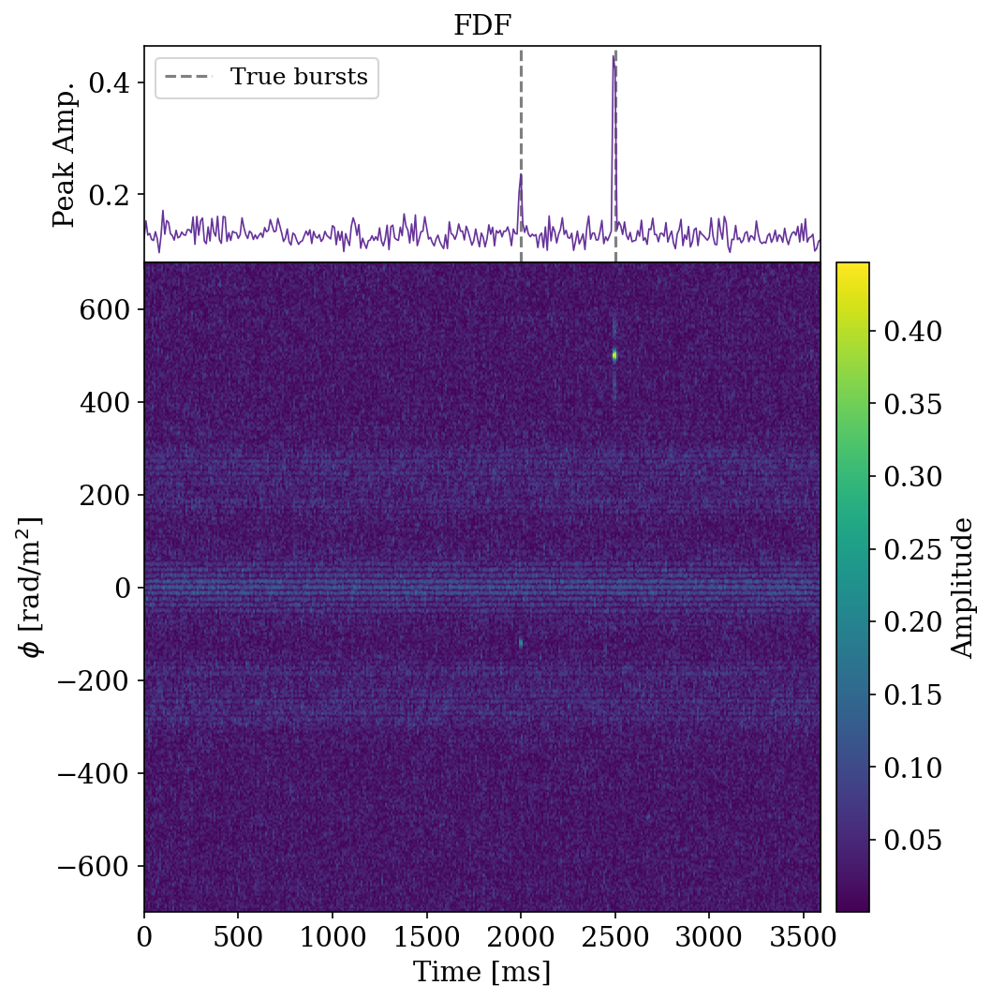

In [33]:
plot_2panels(FDF_arr, time_slice_arr, phi_array, cbar_label='Amplitude', plot_true=True,
             suptitle='FDF', ylim=(-700,700))

# plot_2panels(FDF_norm, time_slice_arr, phi_array, cbar_label='Amplitude', plot_true=True,
#              ylim=(-200,200), suptitle='Normalized FDF')

In [34]:
# Time-averaged plot
# plt.figure(figsize=(8, 5))
# plt.plot(phi_array, np.mean(np.abs(FDF_arr), axis=0), c='rebeccapurple')
# # plt.plot(phi_array, np.sum(FDF_arr, axis=0), c='olive')
# plt.xlabel(r'$\phi$ [rad/m$^2$]')
# plt.ylabel('Mean Amplitude')
# # plt.title('Time-averaged FDF')
# plt.xlim(-200, 200)
# plt.show()

Plot FDF for specific time slices

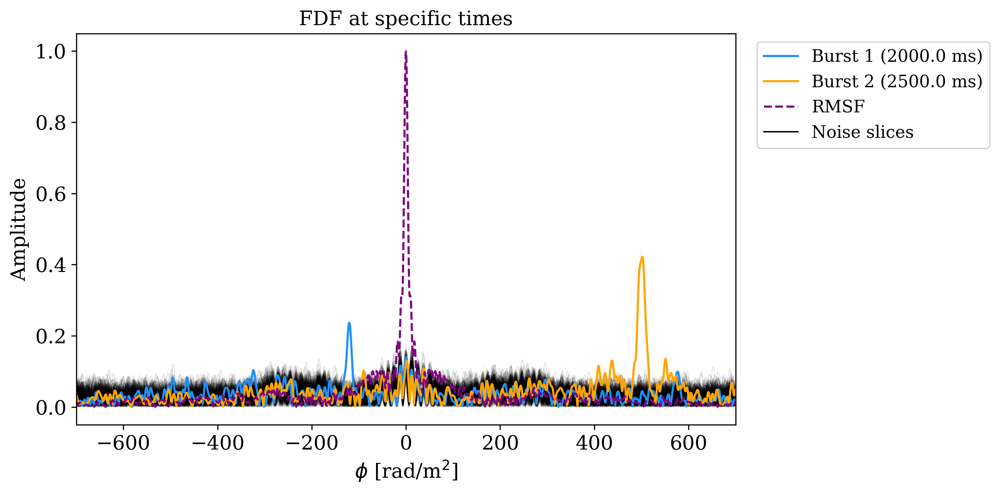

In [41]:
ind1 = np.argmin(np.abs(time_slice_arr - TIME_TRUE[0]))
ind2 = np.argmin(np.abs(time_slice_arr - TIME_TRUE[1]))

plt.figure(figsize=(10, 5))
plt.title('FDF at specific times')

# Plot all FDF slices with low alpha
for i,t_slice in enumerate(FDF_arr):
    color = 'dodgerblue' if i in [ind1-1, ind1, ind1+1] else ('orange' if i in [ind2-1, ind2, ind2+1] else 'black')
    plt.plot(phi_array, abs(FDF_arr[i]), c=color, alpha=0.1, lw=0.7)

# Plot specific bursts with higher alpha
plt.plot(phi_array, abs(FDF_arr[ind1]), alpha=1, lw=1.5, c='dodgerblue',
         label=f'Burst 1 ({time_slice_arr[ind1]:.1f} {t_unit})')
plt.plot(phi_array, abs(FDF_arr[ind2]),
         label=f'Burst 2 ({time_slice_arr[ind2]:.1f} {t_unit})', c='orange')
plt.plot(phi_array, abs(RMSF), label='RMSF', linestyle='--', color='purple')
plt.plot([], [], color='black', alpha=1, lw=1, label='Noise slices')

plt.xlabel(r'$\phi$ [rad/m$^2$]')
plt.ylabel('Amplitude')
plt.xlim(-700, 700)

# Legend in upper right outside the plot
plt.legend(loc='upper left', bbox_to_anchor=(1.02, 1))

plt.tight_layout()
plt.show()

### Cross-Correlating

In [36]:
"""
'full' : fully one edge to the other
output lags are [-leny + 1 to lenx - 1], values tell you how much left end of y has to be shifted wrt left end of x
at the min lag, the right of y is aligned to the left end of x so it lags behind x by the length of leny - 1
At lag = 0, the left of y is aligned to the left of x
for the positive lag values, the left end of y has to slide over all the length of x to reach the right end of x so the lag is up to lenx - 1
The peak in corr at lag l tells you that y most closely matches x when y is shifted left by l samples (or x is shifted right by l).
"""

"\n'full' : fully one edge to the other\noutput lags are [-leny + 1 to lenx - 1], values tell you how much left end of y has to be shifted wrt left end of x\nat the min lag, the right of y is aligned to the left end of x so it lags behind x by the length of leny - 1\nAt lag = 0, the left of y is aligned to the left of x\nfor the positive lag values, the left end of y has to slide over all the length of x to reach the right end of x so the lag is up to lenx - 1\nThe peak in corr at lag l tells you that y most closely matches x when y is shifted left by l samples (or x is shifted right by l).\n"

In [37]:
# Cross-correlate measured FDF with FSF for each time slice
mode = 'full'
cross_corr_len = 2 * len(phi_array) - 1

# Compute cross-correlation for each time slice
cross_corr_arr = np.zeros((len(time_slice_arr), cross_corr_len))  # shape (Ntimes, Nphi)

for i,t in enumerate(time_slice_arr):
    # Get absolute value of FDF for the time slice
    fdf_slice = np.abs(FDF_arr[i])
    # Normalize FDF slice to match FSF normalization
    # fdf_slice /= np.max(fdf_slice)  # Normalize to max value of FDF slice
    
    # Cross-correlate with FSF
    cross_corr_arr[i] = correlate(fdf_slice, np.abs(RMSF), mode='full')

# Get channel lags and corresponding phi values
channel_lags = correlation_lags(len(phi_array), len(phi_array), mode='full')
phi_lags = channel_lags * dphi  # Convert channel lags to phi values

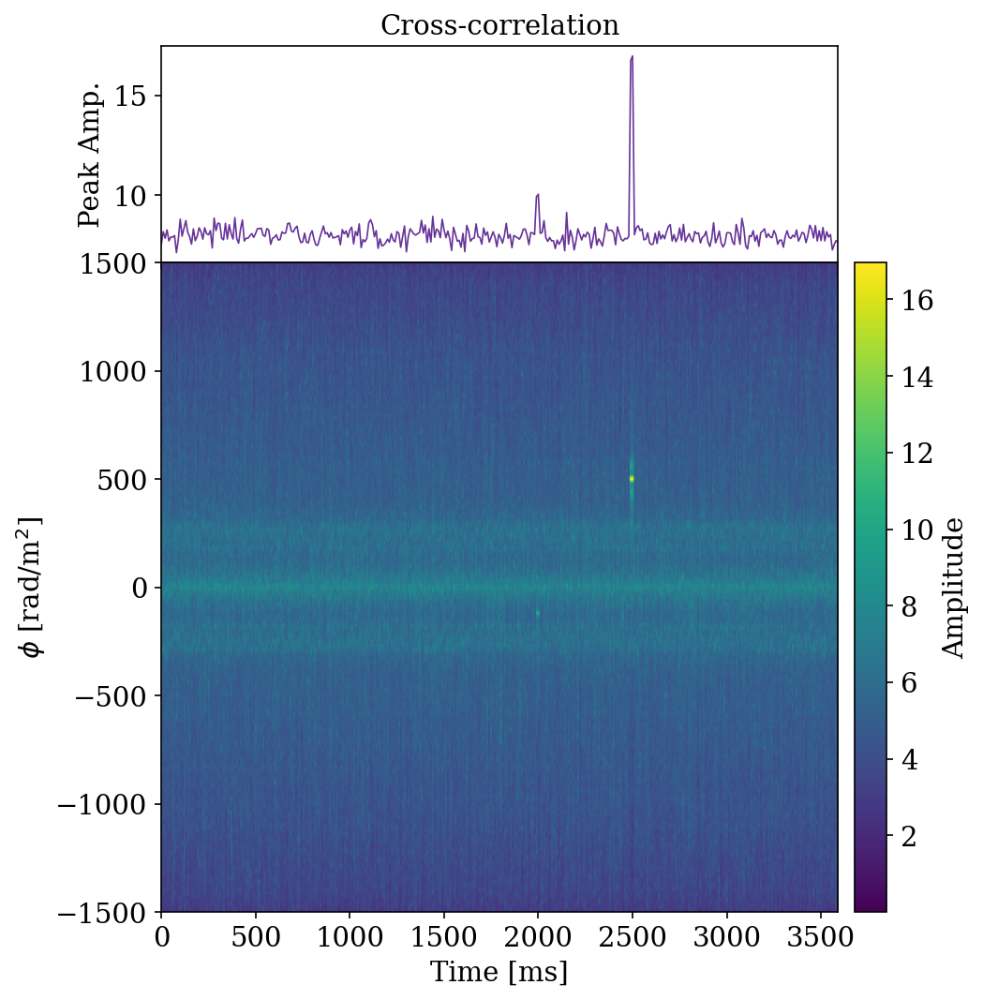

In [38]:
# Plot
plot_2panels(cross_corr_arr, time_slice_arr, phi_lags, ax2_ylabel=r'$\phi$ [rad/m$^2$]', 
			cbar_label='Amplitude', ax1_type='peak', suptitle='Cross-correlation', ylim=(-1500,1500))

Plot cross-correlation for specific time slices

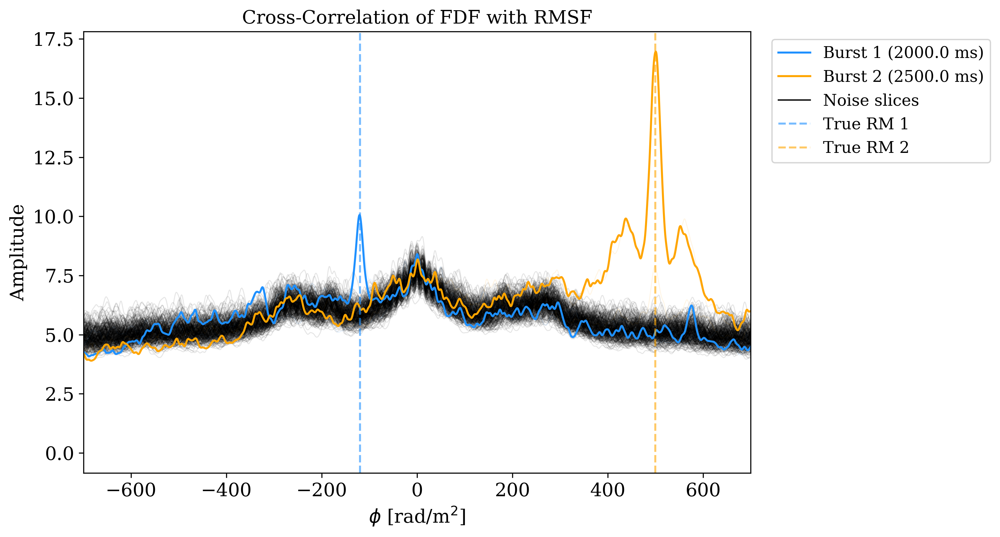

In [39]:
ind1 = np.argmin(np.abs(time_slice_arr - TIME_TRUE[0]))
ind2 = np.argmin(np.abs(time_slice_arr - TIME_TRUE[1]))

plt.figure(figsize=(9, 6))
plt.title('Cross-Correlation of FDF with RMSF')

for i,t_slice in enumerate(cross_corr_arr):
    color = 'dodgerblue' if i in [ind1-1, ind1, ind1+1] else ('orange' if i in [ind2-1, ind2, ind2+1] else 'black')
    plt.plot(phi_lags, abs(t_slice), color=color, alpha=0.1, lw=0.7)

plt.plot(phi_lags, abs(cross_corr_arr[ind1]), color='dodgerblue', label=f'Burst 1 ({time_slice_arr[ind1]:.1f} {t_unit})')
plt.plot(phi_lags, abs(cross_corr_arr[ind2]), color='orange', label=f'Burst 2 ({time_slice_arr[ind2]:.1f} {t_unit})')
plt.plot([], [], color='black', alpha=1, lw=1, label='Noise slices')

plt.axvline(x=RM_true[0], label='True RM 1', 
            color='dodgerblue', linestyle='--', alpha=0.6)
plt.axvline(x=RM_true[1], label='True RM 2', 
            color='orange', linestyle='--', alpha=0.6)

plt.xlabel(r'$\phi$ [rad/m$^2$]')
plt.ylabel('Amplitude')
plt.xlim(-700, 700)

plt.legend(loc='upper left', bbox_to_anchor=(1.02, 1))
plt.show()